### Spark Foundation Intern

### Intern :- Omkar Dalvi

### Task

### In this we will Focus on Highest Global Terrorism Area.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')
import plotly.express as px
import folium
import folium.plugins
from folium.plugins import MarkerCluster 

from wordcloud import WordCloud, ImageColorGenerator



C:\Users\omkar\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df = pd.read_csv("globalterrorismdb_0718dist.csv",encoding='latin-1')
df.head()

C:\Users\omkar\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 146.9+ MB


In [4]:
df.shape

(181691, 135)

In [5]:
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
df.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [7]:
list(df.columns)

['eventid',
 'iyear',
 'imonth',
 'iday',
 'approxdate',
 'extended',
 'resolution',
 'country',
 'country_txt',
 'region',
 'region_txt',
 'provstate',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'vicinity',
 'location',
 'summary',
 'crit1',
 'crit2',
 'crit3',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'success',
 'suicide',
 'attacktype1',
 'attacktype1_txt',
 'attacktype2',
 'attacktype2_txt',
 'attacktype3',
 'attacktype3_txt',
 'targtype1',
 'targtype1_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'target1',
 'natlty1',
 'natlty1_txt',
 'targtype2',
 'targtype2_txt',
 'targsubtype2',
 'targsubtype2_txt',
 'corp2',
 'target2',
 'natlty2',
 'natlty2_txt',
 'targtype3',
 'targtype3_txt',
 'targsubtype3',
 'targsubtype3_txt',
 'corp3',
 'target3',
 'natlty3',
 'natlty3_txt',
 'gname',
 'gsubname',
 'gname2',
 'gsubname2',
 'gname3',
 'gsubname3',
 'motive',
 'guncertain1',
 'guncertain2',
 'guncertain3',
 'individual',
 'nperps',
 'nperpcap',
 

In [8]:
list(df['gname'].unique())

['MANO-D',
 '23rd of September Communist League',
 'Unknown',
 'Black Nationalists',
 'Tupamaros (Uruguay)',
 "New Year's Gang",
 'Weather Underground, Weathermen',
 'Left-Wing Militants',
 'Armed Commandos of Liberation',
 'Commune 1',
 'Eritrean Liberation Front',
 'Strikers',
 'Student Radicals',
 'White extremists',
 'Armed Forces of National Liberation- Venezuela (FALN)',
 "New People's Army (NPA)",
 'Armed Revolutionary Independence Movement (MIRA)',
 'Popular Front for the Liberation of Palestine (PFLP)',
 'Popular Front for the Liberation of Palestine, Gen Cmd (PFLP-GC)',
 '1st of May Group',
 'Rebel Armed Forces of Guatemala (FAR)',
 'Ku Klux Klan',
 'Popular Revolutionary Vanguard (VPR)',
 'Revolutionary Force 9',
 'Puerto Rican Nationalists',
 'Chicano Liberation Front',
 'Puerto Rican Resistance Movement',
 'Black Panthers',
 'Dominican Popular Movement (MPD)',
 'Argentine Liberation Front (FAL)',
 'Argentine National Organization Movement (MANO)',
 'Japanese Red Army (JRA)

In [9]:
df.rename(columns={'iyear':'Year',
                   'imonth':'Month',
                   'iday':'Day',
                   'country_txt':'Country',
                   'region_txt':'Region',
                  'provstate':'State',
                   'city':'City',
                   'latitude':'Latitude',
                   'longitude':'Longitude',
                   'location':'Location',
                  'summary':'Summary',
                   'suicide':'Suicide',
                   'attacktype1_txt':'AttackType1',
                   'attacktype2_txt':'AttackType2',
                  'attacktype3_txt':'AttackType3',
                   'targtype1_txt':'TargetType1',
                   'targsubtype1_txt':'TargetSubType',
                  'corp1':'Corporation1',
                   'target1':'target',
                   'targtype2_txt':'target2',
                   'targsubtype2_txt':'targetSubType2',
                  'corp2':'Corporation2',
                   'target2':'Target2',
                   'targtype3_txt':'targetType3',
                   'corp3':'Corporation3',
                  'motive':'Motive',
                   'weaptype1_txt':'WeaponType1',
                   'weapsubtype1_txt':'WeaponSubType1',
                   'weaptype2_txt':'WeaponType2',
                  'weapsubtype2_txt':'WeaponSubType2',
                   'weaptype3_txt':'WeaponType3',
                   'weapsubtype3_txt':'WeaponSubType3',
                  'weaptype4_txt':'WeaponTyppe4',
                   'weapsubtype4_txt':'WeaponSubType4',
                   'weapdetail':'weaponDetails',
                  'propcomment':'DamageProperty',
                   'ransomnote':'RansomNote',
                   'addnotes':'AddNote',
                   'nkill':'Killed',
                  'nwound':'Wounded',
                   'gname':'Terrorist_gropus_name'},inplace=True)
                  

In [10]:
df = df[['Year','Month','Day','Country','Region','State','City','Latitude','Longitude','Location','Summary','Suicide',
        'AttackType1','AttackType2','AttackType3','TargetType1','TargetSubType','Corporation1','target','target2',
        'targetSubType2','Corporation2','Target2','targetType3','Corporation3','Motive','WeaponType1','WeaponSubType1','WeaponType2',
        'WeaponSubType2','WeaponType3','WeaponSubType3','WeaponTyppe4','WeaponSubType4','weaponDetails','DamageProperty',
        'RansomNote','AddNote','Killed','Wounded','Terrorist_gropus_name']]

In [11]:
df["AttackType"] = df['AttackType1']+df['AttackType2']+df['AttackType3']
df["Target"] = df["TargetType1"] + df["target2"] + df["targetType3"]
df["TargetSubType"] = df["TargetSubType"]+ df["targetSubType2"] 
df["WeaponType"] = df["WeaponType1"]+df["WeaponType2"]+df["WeaponType3"]+df["WeaponTyppe4"]
df["WeaponSubType"] = df["WeaponSubType1"]+df["WeaponSubType2"]+df["WeaponSubType3"]+df["WeaponSubType4"]

In [12]:
df.drop(['AttackType1', 'AttackType2','AttackType3'], axis = 1,inplace=True)
df.drop(['TargetType1', 'target2','targetType3'], axis = 1,inplace=True)
df.drop(['TargetSubType', 'targetSubType2'], axis = 1,inplace=True)
df.drop(['WeaponType1', 'WeaponType2','WeaponType3','WeaponTyppe4'], axis = 1,inplace=True)
df.drop(['WeaponSubType1', 'WeaponSubType2','WeaponSubType3','WeaponSubType4'], axis = 1,inplace=True)
#del df[""]

df.shape

(181691, 29)

In [13]:
df.head()

,Year,Month,Day,Country,Region,State,City,Latitude,Longitude,Location,...,DamageProperty,RansomNote,AddNote,Killed,Wounded,Terrorist_gropus_name,AttackType,Target,WeaponType,WeaponSubType
0,1970,7,2,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,NaN,...,NaN,NaN,NaN,1.0,0.0,MANO-D,NaN,NaN,NaN,NaN
1,1970,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,NaN,...,NaN,NaN,NaN,0.0,0.0,23rd of September Communist League,NaN,NaN,NaN,NaN
2,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,NaN,...,NaN,NaN,NaN,1.0,0.0,Unknown,NaN,NaN,NaN,NaN
3,1970,1,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,NaN,...,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN
4,1970,1,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,NaN,...,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN


In [14]:
def data_inv(df):
    print('Number of Rows:',df.shape[0]) # Total counts of Movies & TV-show
    print('dataset variables: ',df.shape[1])    # gives Total count of column
    print('-'*70)
    print('dataset columns :\n') # All column_Name
    print(df.columns)
    print('-'*70)
    print('data-type of each column: \n') # 
    print(df.dtypes)
    print('-'*70)
    print('Missing rows in each column: \n')
    c=df.isnull().sum()
    print(c[c>0])

In [15]:
data_inv(df)

Number of Rows: 181691
dataset variables:  29
----------------------------------------------------------------------
dataset columns :

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'State', 'City',
       'Latitude', 'Longitude', 'Location', 'Summary', 'Suicide',
       'Corporation1', 'target', 'Corporation2', 'Target2', 'Corporation3',
       'Motive', 'weaponDetails', 'DamageProperty', 'RansomNote', 'AddNote',
       'Killed', 'Wounded', 'Terrorist_gropus_name', 'AttackType', 'Target',
       'WeaponType', 'WeaponSubType'],
      dtype='object')
----------------------------------------------------------------------
data-type of each column: 

Year                       int64
Month                      int64
Day                        int64
Country                   object
Region                    object
State                     object
City                      object
Latitude                 float64
Longitude                float64
Location                  object
Summary  

In [16]:
city=df["Country"].unique()
print(city)

['Dominican Republic' 'Mexico' 'Philippines' 'Greece' 'Japan'
 'United States' 'Uruguay' 'Italy' 'East Germany (GDR)' 'Ethiopia'
 'Guatemala' 'Venezuela' 'West Germany (FRG)' 'Switzerland' 'Jordan'
 'Spain' 'Brazil' 'Egypt' 'Argentina' 'Lebanon' 'Ireland' 'Turkey'
 'Paraguay' 'Iran' 'United Kingdom' 'Colombia' 'Bolivia' 'Nicaragua'
 'Netherlands' 'Belgium' 'Canada' 'Australia' 'Pakistan' 'Zambia' 'Sweden'
 'Costa Rica' 'South Yemen' 'Cambodia' 'Israel' 'Poland' 'Taiwan' 'Panama'
 'Kuwait' 'West Bank and Gaza Strip' 'Austria' 'Czechoslovakia' 'India'
 'France' 'South Vietnam' 'Brunei' 'Zaire'
 "People's Republic of the Congo" 'Portugal' 'Algeria' 'El Salvador'
 'Thailand' 'Haiti' 'Sudan' 'Morocco' 'Cyprus' 'Myanmar' 'Afghanistan'
 'Peru' 'Chile' 'Honduras' 'Yugoslavia' 'Ecuador' 'New Zealand' 'Malaysia'
 'Singapore' 'Botswana' 'Jamaica' 'Chad' 'North Yemen' 'Andorra' 'Syria'
 'South Korea' 'United Arab Emirates' 'South Africa' 'Kenya' 'Iraq'
 'Somalia' 'Tanzania' 'Sri Lanka' 'Namibia' '

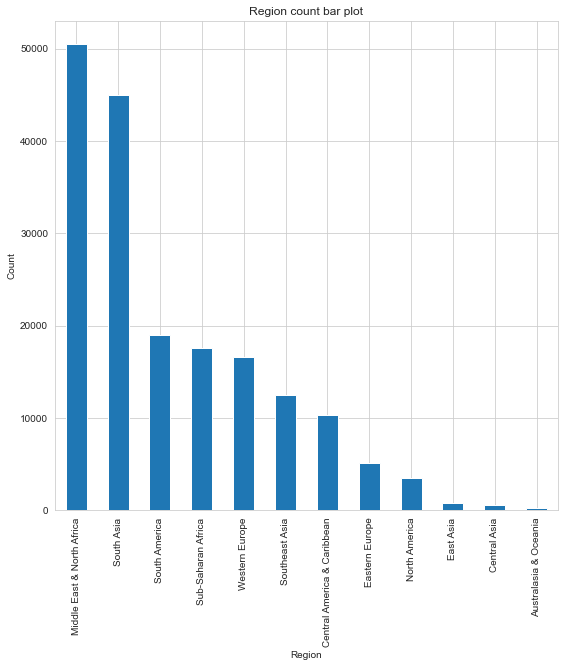

In [17]:
plt.figure(figsize=(9,9))
df["Region"].value_counts().plot(kind="bar")
plt.title("Region count bar plot")
plt.ylabel("Count")
plt.xlabel("Region")
plt.show()

### Above graph tells Middle east and North africa are highest terrorist region.

In [18]:
#pip install wordcloud

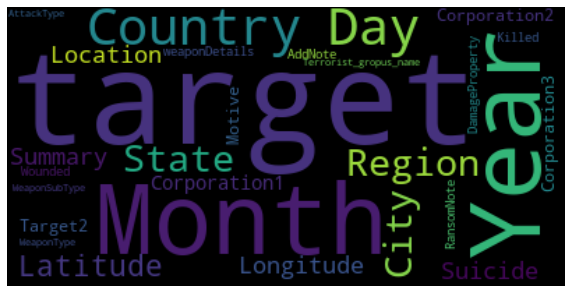

In [19]:
word = ','.join(map(str, df))
from wordcloud import WordCloud , STOPWORDS
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = "Black", max_words = 200, stopwords = stopwords).generate(word)
plt.figure(1,figsize=(10, 10))
plt.axis('off')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.show()

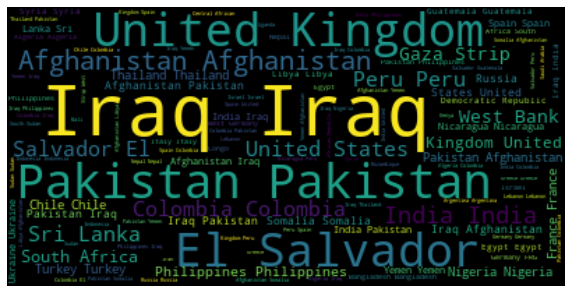

In [20]:
word = ','.join(map(str, df["Country"]))
from wordcloud import WordCloud , STOPWORDS
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = "Black", max_words = 200, stopwords = stopwords).generate(word)
plt.figure(1,figsize=(10, 10))
plt.axis('off')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.show()

In [21]:
df[df["Country"] == 'India']["Killed"].unique()

array([  0.,   4.,  nan,   3.,   1.,   2.,   6.,   9.,  20.,  19.,   5.,
        10.,  14.,  31.,   7.,   8.,  15.,  11.,  24.,  34.,  13.,  32.,
        37.,  12.,  18.,  21.,  17.,  16.,  27.,  23.,  29.,  47.,  30.,
        48.,  62.,  42.,  38., 115.,  61.,  22.,  70.,  33.,  25.,  39.,
        60.,  26.,  35.,  52.,  28.,  55., 188.,  66.,  40.,  58.,  68.,
        82.,  36.])

### Checking Terrorist attacks on India.

In [22]:
df_India = df[df["Country"] == 'India']

In [23]:
df_India.head()

,Year,Month,Day,Country,Region,State,City,Latitude,Longitude,Location,...,DamageProperty,RansomNote,AddNote,Killed,Wounded,Terrorist_gropus_name,AttackType,Target,WeaponType,WeaponSubType
1186,1972,2,22,India,South Asia,Delhi,New Delhi,28.585836,77.153336,NaN,...,NaN,NaN,NaN,0.0,0.0,Palestinians,NaN,NaN,NaN,NaN
2764,1975,1,2,India,South Asia,Bihar,Samastipur,25.863042,85.781004,The attack occurred in the town,...,NaN,NaN,The case is very unclear and there are many ru...,4.0,0.0,Ananda Marga,NaN,NaN,NaN,NaN
3857,1976,5,26,India,South Asia,Delhi,New Delhi,28.585836,77.153336,NaN,...,NaN,NaN,NaN,0.0,0.0,Unknown,NaN,NaN,NaN,NaN
5327,1977,9,28,India,South Asia,Maharashtra,Bombay,19.075984,72.877656,NaN,...,NaN,NaN,NaN,0.0,0.0,Japanese Red Army (JRA),NaN,NaN,NaN,NaN
7337,1979,1,13,India,South Asia,Assam,Unknown,26.200605,92.937574,NaN,...,NaN,NaN,NaN,NaN,NaN,Naga People,NaN,NaN,NaN,NaN


In [24]:
def data_inv(df_India):
    print('Number of Rows:',df_India.shape[0]) # Total counts of Movies & TV-show
    print('dataset variables: ',df_India.shape[1])    # gives Total count of column
    print('-'*70)
    print('dataset columns :\n') # All column_Name
    print(df_India.columns)
    print('-'*70)
    print('data-type of each column: \n') # 
    print(df_India.dtypes)
    print('-'*70)
    print('Missing rows in each column: \n')
    c=df_India.isnull().sum()
    print(c[c>0])

In [25]:
data_inv(df_India)

Number of Rows: 11960
dataset variables:  29
----------------------------------------------------------------------
dataset columns :

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'State', 'City',
       'Latitude', 'Longitude', 'Location', 'Summary', 'Suicide',
       'Corporation1', 'target', 'Corporation2', 'Target2', 'Corporation3',
       'Motive', 'weaponDetails', 'DamageProperty', 'RansomNote', 'AddNote',
       'Killed', 'Wounded', 'Terrorist_gropus_name', 'AttackType', 'Target',
       'WeaponType', 'WeaponSubType'],
      dtype='object')
----------------------------------------------------------------------
data-type of each column: 

Year                       int64
Month                      int64
Day                        int64
Country                   object
Region                    object
State                     object
City                      object
Latitude                 float64
Longitude                float64
Location                  object
Summary   

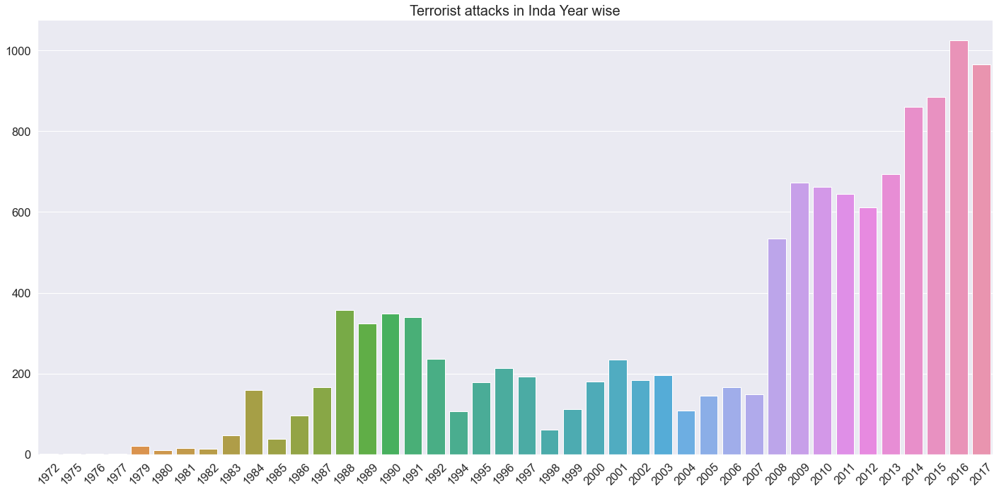

In [26]:
sns.set(font_scale=1.5)
fig = plt.figure(figsize=(20,10))
sns.countplot(x='Year',data=df_India);
plt.xlabel('')
plt.ylabel('')
plt.xticks(rotation=45)
plt.title('Terrorist attacks in Inda Year wise', fontsize=20)
plt.tight_layout()

In [27]:
dups = df_India.duplicated(['City'])
df_India[dups]['City']

3857          New Delhi
8174            Unknown
8685            Unknown
8831            Unknown
8837             Aizawl
              ...      
181586         Basaguda
181587         Basaguda
181612          Motbung
181663    Koothuparamba
181689           Imphal
Name: City, Length: 7162, dtype: object

### Details

In [28]:
for i in df_India[dups]['City'].unique():
    print(df_India[df_India['City']==i][['City','Year','target','Killed','Wounded']])
    print('-'*60)

             City  Year                               target  Killed  Wounded
1186    New Delhi  1972                                B-747     0.0      0.0
3857    New Delhi  1976                    New Delhi airport     0.0      0.0
9157    New Delhi  1979                   Magistrate's court     1.0      1.0
9158    New Delhi  1979                              station     1.0      0.0
10821   New Delhi  1980                 Baba Gurbachan Singh     1.0      0.0
...           ...   ...                                  ...     ...      ...
105724  New Delhi  2012         Diplomat: Tal Yehoshua Koren     0.0      2.0
106050  New Delhi  2012                              Unknown     0.0      0.0
117806  New Delhi  2013  First Trade Secretary: Zargham Raza     0.0      2.0
141113  New Delhi  2014                               Church     0.0      0.0
159022  New Delhi  2016           Jan Shatabdi Express Train     0.0      0.0

[157 rows x 5 columns]
----------------------------------------

       City  Year                           target  Killed  Wounded
33202  Mand  1988                      police unit     2.0      0.0
33674  Mand  1988                   Farming Family     3.0      0.0
73359  Mand  2001  Indian soldiers in Manda, India     2.0      2.0
------------------------------------------------------------
                    City  Year           target  Killed  Wounded
33148  Faridkot District  1988  Private Citizen     1.0      0.0
33773  Faridkot District  1988           farmer     1.0      0.0
36509  Faridkot District  1988        caretaker     1.0      0.0
37500  Faridkot District  1989      Police Unit     4.0      0.0
------------------------------------------------------------
           City  Year                   target  Killed  Wounded
31894  Phagwara  1987             Private Home     2.0      0.0
33869  Phagwara  1988                     camp     0.0      0.0
34752  Phagwara  1988             Govt Cashier     1.0      0.0
37535  Phagwara  1989  Vi

           City  Year    target  Killed  Wounded
34514  Gujarpur  1988  Laborers     9.0      0.0
39164  Gujarpur  1989      Unit     2.0      0.0
------------------------------------------------------------
         City  Year       target  Killed  Wounded
34026  Kohali  1988  police unit     1.0      0.0
39217  Kohali  1989         Unit     4.0      0.0
40547  Kohali  1989         unit     5.0      0.0
------------------------------------------------------------
               City  Year                     target  Killed  Wounded
32557  Badhni Kalan  1987       Badhni Kalan Village     8.0      7.0
39293  Badhni Kalan  1989  family, farmer Gian Singh    10.0      0.0
------------------------------------------------------------
        City  Year              target  Killed  Wounded
36702  Makhu  1988  six bus passengers     0.0      0.0
39727  Makhu  1989                unit     2.0      0.0
41104  Makhu  1990              Bazaar     2.0      4.0
------------------------------------

                City  Year   target  Killed  Wounded
37504  Jhabal Mannan  1989  teacher     1.0      0.0
47606  Jhabal Mannan  1991   street     1.0      3.0
------------------------------------------------------------
           City  Year                                   target  Killed  \
41999  Warangal  1990                          Arrack Godown *     3.0   
47762  Warangal  1991    Developmental officer, Asst. Engineer     0.0   
57832  Warangal  1994                                   Office     0.0   
57871  Warangal  1994           State Minister Narasimha Reddy     9.0   
63604  Warangal  1996                              police jeep     7.0   
78384  Warangal  2005  Hospital where police transported rebel     1.0   

       Wounded  
41999      0.0  
47762      0.0  
57832      0.0  
57871      0.0  
63604      3.0  
78384     12.0  
------------------------------------------------------------
            City  Year                              target  Killed  Wounded
36757

              City  Year              target  Killed  Wounded
61797  Rajapalayam  1996  Low-caste villager     1.0      0.0
61848  Rajapalayam  1996         Rival caste     4.0      0.0
62077  Rajapalayam  1996            Shepherd     1.0      0.0
62078  Rajapalayam  1996     Rickshaw-puller     1.0      0.0
------------------------------------------------------------
                      City  Year  \
37283   Kokrajhar district  1989   
61868   Kokrajhar district  1996   
62404   Kokrajhar district  1996   
62405   Kokrajhar district  1996   
62406   Kokrajhar district  1996   
62407   Kokrajhar district  1996   
62408   Kokrajhar district  1996   
62409   Kokrajhar district  1996   
62410   Kokrajhar district  1996   
62411   Kokrajhar district  1996   
62412   Kokrajhar district  1996   
62413   Kokrajhar district  1996   
62414   Kokrajhar district  1996   
62415   Kokrajhar district  1996   
62416   Kokrajhar district  1996   
62417   Kokrajhar district  1996   
62418   Kokrajhar

142000     0.0      0.0  
------------------------------------------------------------
            City  Year                                             target  \
37206   Salakati  1989                             3 Government Employees   
69311   Salakati  1999  New Delhi-Guwahati Rajdhani Express travelling...   
156350  Salakati  2015                                     Railway Tracks   

        Killed  Wounded  
37206      3.0      0.0  
69311      NaN      5.0  
156350     0.0      0.0  
------------------------------------------------------------
                    City  Year  \
68239  Sonitpor district  1998   
69316  Sonitpor district  1999   
89659  Sonitpor district  2008   
91538  Sonitpor district  2009   
92749  Sonitpor district  2009   
96168  Sonitpor district  2010   
98982  Sonitpor district  2010   

                                                  target  Killed  Wounded  
68239                       Residents of Sonitpur, India     5.0      5.0  
69316         

         City  Year                                    target  Killed  Wounded
63037  Dhubri  1996                            Police vehicle     4.0      NaN
73286  Dhubri  2001             Police patrol in Assam, India     5.0      4.0
88480  Dhubri  2008  Civilians were the target of the attack.     0.0      2.0
95064  Dhubri  2010                     The target was a bus.     0.0      0.0
------------------------------------------------------------
           City  Year                                             target  \
43130   Achabal  1990                                               Unit   
73517   Achabal  2001                        Civilians in Achabal, India   
151002  Achabal  2015                                           Bus Stop   
168273  Achabal  2016  Residence of Former Minister: Peer Muhammad Hu...   
173759  Achabal  2017                                           Officers   
173761  Achabal  2017                                             Patrol   

        Kil

       City  Year                                             target  Killed  \
58840   Uri  1995                                               Army    12.0   
76397   Uri  2004  People's Democratic Party meeting in the city ...     9.0   
118893  Uri  2013                              Soldiers: Yam Bahadur     1.0   
166038  Uri  2016                                           Soldiers     5.0   
167093  Uri  2016                                       Headquarters    24.0   

        Wounded  
58840       0.0  
76397      30.0  
118893      0.0  
166038      0.0  
167093     17.0  
------------------------------------------------------------
            City  Year                      target  Killed  Wounded
75042   Ashmuqam  2003  Indian Police Force Convoy     1.0      6.0
76648   Ashmuqam  2004        Ruling Party Workers     1.0      NaN
168506  Ashmuqam  2016                      School     0.0      0.0
168676  Ashmuqam  2016                      School     0.0      0.0
----------

                   City  Year                                         target  \
79671   Bastar district  2006          Civilians in Bastar (District), India   
83304   Bastar district  2007                             Civilian employees   
83305   Bastar district  2007               220kv power transimission towers   
87693   Bastar district  2008         Two civilians were targeted in Bastar.   
89622   Bastar district  2008      The target was a polling booth at Pordem.   
103362  Bastar district  2011                         A paramilitary vehicle   
120653  Bastar district  2013                         Commander: Lauh Bhagat   
130122  Bastar district  2014                                Polling Station   
130123  Bastar district  2014                                Polling Station   
130124  Bastar district  2014                                Polling Station   
131870  Bastar district  2014                                  Freight Train   
140722  Bastar district  2014           

          City  Year                                             target  \
58685   Kohima  1995                          Convoy of Security Forces   
87857   Kohima  2008  The attack targeted a former National Socialis...   
87915   Kohima  2008                                A  NSCN-IM militant   
88537   Kohima  2008  A National Socialist Council of Nagaland-Isak-...   
88556   Kohima  2008  The target of the attack was a National Social...   
88957   Kohima  2008  A National Socialist Council of Nagaland-Isak-...   
88975   Kohima  2008  A house reported to be the transit camp of NSC...   
109161  Kohima  2012       Press Secretary to Chief Minister: Abu Metha   
144484  Kohima  2015                                            Laborer   
144779  Kohima  2015                  Residence of Member: T.R. Zeliang   
146064  Kohima  2015  19th Battalion Soldiers: Gupta, Hav Virender S...   
146828  Kohima  2015                                            Unknown   
146887  Kohima  2015     

89779  Parakhowa  2008            A prayer hall     0.0      0.0
------------------------------------------------------------
                    City  Year  \
86423   Giridih district  2008   
89810   Giridih district  2008   
93926   Giridih district  2009   
94124   Giridih district  2009   
94125   Giridih district  2009   
94554   Giridih district  2009   
94555   Giridih district  2009   
95846   Giridih district  2010   
98154   Giridih district  2010   
99057   Giridih district  2010   
105808  Giridih district  2012   
126471  Giridih district  2014   
126790  Giridih district  2014   
129066  Giridih district  2014   
130466  Giridih district  2014   
130515  Giridih district  2014   
130516  Giridih district  2014   
145574  Giridih district  2015   
160927  Giridih district  2016   
161865  Giridih district  2016   
174833  Giridih district  2017   

                                                   target  Killed  Wounded  
86423   The ailway track between Hazaribagh Road

165305     0.0      0.0  
------------------------------------------------------------
               City  Year                                             target  \
89780   Chitrakonda  2008                                     Four policemen   
91513   Chitrakonda  2009  Polling booths, electronic voting machines, an...   
92112   Chitrakonda  2009  The target was the town trader's association p...   
92136   Chitrakonda  2009         An iron ore pipeline of the Essar Company.   
92185   Chitrakonda  2009                            The Essar Steel Company   
94228   Chitrakonda  2009                        The Essar Steel guest house   
95824   Chitrakonda  2010                      The Essar Company guest house   
123628  Chitrakonda  2013                               Suspected Informants   
152083  Chitrakonda  2015                                          Pipelines   
167387  Chitrakonda  2016                                          Civilians   
171147  Chitrakonda  2017  Pancha

96268     1.0      0.0  
------------------------------------------------------------
                           City  Year  \
89972   East Singhbhum district  2008   
93078   East Singhbhum district  2009   
95000   East Singhbhum district  2010   
95912   East Singhbhum district  2010   
96305   East Singhbhum district  2010   
97753   East Singhbhum district  2010   
151710  East Singhbhum district  2015   

                                                   target  Killed  Wounded  
89972                     Sobhan Tuddu, a school teacher,     1.0      0.0  
93078   Members of the Jharkhand Liberation Front (JMM...     1.0      1.0  
95000                   The target was a college student.     1.0      0.0  
95912   A local leader of the Congress Party, Gobardha...     1.0      0.0  
96305               A health care worker, Subhash Mahato,     1.0      0.0  
97753                                   A school building     0.0      0.0  
151710                                        

94997  Nabha  2010   Petroleum gas facility     0.0      0.0
------------------------------------------------------------
           City  Year                                             target  \
91453   Koraput  2009                                 An election office   
95039   Koraput  2010  The target of this attack was the revenue divi...   
95050   Koraput  2010            The targets of the attacks were police.   
95056   Koraput  2010                        The targets were civilians.   
102316  Koraput  2011     A police constable was targeted in the attack.   
102552  Koraput  2011                                      A local court   
103004  Koraput  2011                                    Three villagers   
103005  Koraput  2011                                      Two villagers   
103231  Koraput  2011  A civilian and suspected police informer ident...   
103512  Koraput  2011                         A civilian, Puala Sadaram,   
107495  Koraput  2012                     

100303  Parimal Hansda, a Jharkhand Mukti Morcha (JMM)...     1.0      0.0  
------------------------------------------------------------
              City  Year                                             target  \
91430  Bhula Bheda  2009  A branch committee member of the Communist Par...   
96711  Bhula Bheda  2010  A former member of the Communist Party of Indi...   

       Killed  Wounded  
91430     1.0      0.0  
96711     1.0      0.0  
------------------------------------------------------------
            City  Year                                             target  \
87855   Senapati  2008  The attack targeted a Kuki Revolutionary Army ...   
96762   Senapati  2010  The residence of Manipur tribal welfare minist...   
102832  Senapati  2011                              A truck carrying rice   
112898  Senapati  2012                                             Convoy   
118645  Senapati  2013  Convoy of Ministers: Kh Ratankumar, Ngamthang ...   
146413  Senapati  2015    

99110      0.0  
------------------------------------------------------------
               City  Year                       target  Killed  Wounded
99116   Nongalbibra  2010  Nazrul Islam, a coal-miner,     1.0      0.0
99117   Nongalbibra  2010     Kuki Boro, a coal miner,     1.0      0.0
112268  Nongalbibra  2012                       Patrol     3.0      5.0
------------------------------------------------------------
          City  Year                                             target  \
97961  Bariatu  2010                                     Three vehicles   
99126  Bariatu  2010  A civilian and suspected police informer was t...   

       Killed  Wounded  
97961     0.0      1.0  
99126     4.0      0.0  
------------------------------------------------------------
               City  Year                                             target  \
80354   Bhairamgarh  2006                         Body intended for recovery   
99170   Bhairamgarh  2010  Nandu Karma, a key leade

100848  Ajmer  2011  A bus stand was targeted in the attack.     0.0      0.0
------------------------------------------------------------
          City  Year                                   target  Killed  Wounded
93984   Korchi  2009        The target was a polling station.     0.0      0.0
100912  Korchi  2011              A suspected police informer     1.0      0.0
170733  Korchi  2016                                Civilians     1.0      0.0
178682  Korchi  2017  Constables: Manit Harami, Ashish Madavi     0.0      1.0
------------------------------------------------------------
            City  Year                                             target  \
100733  Kanaudha  2011                                    Three civilians   
100958  Kanaudha  2011  A private road construction firm was targeted ...   

        Killed  Wounded  
100733     2.0      0.0  
100958     0.0      5.0  
------------------------------------------------------------
            City  Year            

163511  Madded  2016  Ward Member: Ramsai Majji     1.0      0.0
------------------------------------------------------------
            City  Year                          target  Killed  Wounded
95081   Golaghat  2010  The target was a business man.     0.0      0.0
102550  Golaghat  2011        Two construction workers     0.0      0.0
------------------------------------------------------------
             City  Year                                             target  \
95746   Bariarpur  2010         A civilian bus was targeted in the attack.   
102630  Bariarpur  2011  The residence of a village chief, identified a...   
102631  Bariarpur  2011  The residence of a villager identified as Asho...   

        Killed  Wounded  
95746      0.0     12.0  
102630     0.0      0.0  
102631     0.0      0.0  
------------------------------------------------------------
         City  Year                                             target  \
81815   Tahab  2006                          

            City  Year                                             target  \
88593   Wangkhem  2008  The residential complex of Congress MLA, K. Me...   
107576  Wangkhem  2012                            Residence of Shop Owner   

        Killed  Wounded  
88593      0.0      0.0  
107576     0.0      0.0  
------------------------------------------------------------
               City  Year                        target  Killed  Wounded
93750   Gandacherra  2009  Gandacherra tribal villagers     0.0      0.0
107612  Gandacherra  2012                       Farmers     0.0      0.0
------------------------------------------------------------
                City  Year                                           target  \
102509  Narayanpatna  2011  The target of the armed assault was a civilian.   
107707  Narayanpatna  2012                    Contractor: J Rajendra Prasad   
108568  Narayanpatna  2012                        Tribal Elder: Sukra Huika   

        Killed  Wounded  
102509

113643  Menda  2013  Construction Vehicles     0.0      0.0
------------------------------------------------------------
             City  Year                        target  Killed  Wounded
111218  Timilwada  2012                          Camp     0.0      2.0
113772  Timilwada  2013                        Patrol     1.0      1.0
117068  Timilwada  2013  9th and 13th Battalions Camp     1.0      0.0
143463  Timilwada  2015                          Camp     0.0      0.0
144566  Timilwada  2015           Road Opening Patrol     1.0      1.0
150547  Timilwada  2015                      Officers     0.0      2.0
153475  Timilwada  2015        Soldier: Devraj Cherpa     0.0      1.0
------------------------------------------------------------
             City  Year                   target  Killed  Wounded
113979  Jaleshwar  2013  Member: Mainuddin Ahmed     0.0      0.0
113985  Jaleshwar  2013          School Building     0.0      0.0
----------------------------------------------------

120511  Chola  2013  Journalist: Zakaullah     1.0      0.0
------------------------------------------------------------
          City  Year                                         target  Killed  \
71538   Arwani  2000  Ali Mohammad Sagar, the Public Works Minister     0.0   
120588  Arwani  2013                        14th Battalion Officers     1.0   
177514  Arwani  2017                                           Bank     0.0   
179899  Arwani  2017                 Non-Local Vendor: Shakir Ahmed     1.0   

        Wounded  
71538      15.0  
120588      1.0  
177514      0.0  
179899      0.0  
------------------------------------------------------------
                    City  Year  \
86857   Shopian district  2008   
121222  Shopian district  2013   
130813  Shopian district  2014   
139848  Shopian district  2014   
141106  Shopian district  2014   
141471  Shopian district  2014   
149217  Shopian district  2015   
151003  Shopian district  2015   
151786  Shopian district  

127508      0.0  
------------------------------------------------------------
        City  Year                  target  Killed  Wounded
98160   Amas  2010  A private mobile tower     0.0      1.0
127722  Amas  2014     Amas Police Station     1.0      0.0
------------------------------------------------------------
         City  Year                         target  Killed  Wounded
114396  Andro  2013                       Officers     0.0      0.0
127813  Andro  2014  Member: Shyamkumar Thounaojam     0.0      0.0
------------------------------------------------------------
          City  Year                                    target  Killed  \
98633   Mazbat  2010  A contractor was targeted in the attack.     1.0   
128203  Mazbat  2014                               Patrol Team     0.0   
129339  Mazbat  2014                    Officer: Sindhe Prasad     0.0   

        Wounded  
98633       0.0  
128203      4.0  
129339      2.0  
----------------------------------------------

135551      1.0  
------------------------------------------------------------
              City  Year                       target  Killed  Wounded
135546  Badiliguda  2014   Village Head: Deba Padiami     1.0      0.0
135582  Badiliguda  2014  Village Head: Ganga Madkami     1.0      0.0
------------------------------------------------------------
                    City  Year  \
77790   Dimapur district  2005   
135637  Dimapur district  2014   

                                                   target  Killed  Wounded  
77790                                      Hotel Ambarish     0.0      5.0  
135637  Truck Drivers: Langoljam Radhamohon, Khumanthe...     0.0      0.0  
------------------------------------------------------------
               City  Year                          target  Killed  Wounded
108707  Mendipathar  2012     Secretary: Sengkan K Sangma     1.0      0.0
135688  Mendipathar  2014  Civilian: Tenny Birth Ch Momin     NaN      NaN
139727  Mendipathar  2014  

177394  Katekalyan  2017               Constable: Laxmaih     0.0      1.0
------------------------------------------------------------
         City  Year                           target  Killed  Wounded
45526   Kochi  1991  Vehicle Carrying Bank Officials     0.0      0.0
143624  Kochi  2015                   Project Office     0.0      0.0
------------------------------------------------------------
                       City  Year                            target  Killed  \
123678  Hailakandi district  2013                    Bamboo Workers     NaN   
143801  Hailakandi district  2015                              Shop     0.0   
164389  Hailakandi district  2016  Forest Ranger: Manoj Kumar Sinha     0.0   
169339  Hailakandi district  2016                         Civilians     1.0   

        Wounded  
123678      NaN  
143801      3.0  
164389      0.0  
169339      0.0  
------------------------------------------------------------
           City  Year                         

151476  Jiyan  2015   Civilians     NaN      NaN
------------------------------------------------------------
             City  Year             target  Killed  Wounded
84816   Maheshpur  2007  People at a rally     0.0     10.0
151477  Maheshpur  2015          Civilians     NaN      NaN
------------------------------------------------------------
         City  Year            target  Killed  Wounded
151511  Tisia  2015  Cell Phone Tower     0.0      0.0
151512  Tisia  2015  Cell Phone Tower     0.0      0.0
------------------------------------------------------------
                 City  Year             target  Killed  Wounded
151798  Visakhapatnam  2015  House of Employee     0.0      0.0
151799  Visakhapatnam  2015  House of Employee     0.0      0.0
151800  Visakhapatnam  2015  House of Employee     0.0      0.0
151801  Visakhapatnam  2015  House of Employee     0.0      0.0
171226  Visakhapatnam  2017          Civilians     0.0      0.0
171292  Visakhapatnam  2017          Ci

                City  Year                                  target  Killed  \
156811  Madathakonda  2015  Suspected Informant: Vantala Satya Rao     1.0   
156812  Madathakonda  2015                     Suspected Informant     0.0   

        Wounded  
156811      0.0  
156812      1.0  
------------------------------------------------------------
                 City  Year                             target  Killed  \
156487  Simra Nizamat  2015  Children: Mohammed Safar, Murtuza     0.0   
156816  Simra Nizamat  2015                            Unknown     0.0   

        Wounded  
156487      2.0  
156816      0.0  
------------------------------------------------------------
           City  Year                                    target  Killed  \
133911  Mendhar  2014        Office of Deputy Revenue Collector     0.0   
157087  Mendhar  2015                                   Unknown     0.0   
170437  Mendhar  2016  21 Punjab Regiment Soldier: Minter Singh     0.0   

        Wou

162679     0.0      0.0  
------------------------------------------------------------
          City  Year                              target  Killed  Wounded
157397  Mirtur  2016  Suspected Informant: Sukhram Kadti     1.0      0.0
162680  Mirtur  2016                                Camp     0.0      3.0
------------------------------------------------------------
                  City  Year    target  Killed  Wounded
123952  Dumka district  2013    Convoy     5.0      2.0
162686  Dumka district  2016  Vehicles     0.0      0.0
------------------------------------------------------------
           City  Year                                             target  \
146714  Cholnar  2015  Officers: Jaiprakash Paswan, Alauddin, Lallu P...   
162846  Cholnar  2016                               Civilian: Joga Madvi   
176157  Cholnar  2017                Former Sarpanch: Chhannuram Mandavi   

        Killed  Wounded  
146714     5.0      7.0  
162846     1.0      0.0  
176157     1.0    

167806  Langait  2016       Post     3.0      0.0
------------------------------------------------------------
           City  Year                                             target  \
159146  Sempora  2016                                             Convoy   
167936  Sempora  2016  Entrepreneurial Development Institute (EDI) Bu...   

        Killed  Wounded  
159146     9.0     18.0  
167936     2.0      2.0  
------------------------------------------------------------
          City  Year  target  Killed  Wounded
120983  Gagran  2013    Camp     4.0      1.0
167983  Gagran  2016  Convoy     0.0     12.0
------------------------------------------------------------
             City  Year                           target  Killed  Wounded
166774  Kralagund  2016                           Convoy     0.0      3.0
168023  Kralagund  2016  Party Leader: Ghulam Nabi Khoja     1.0      0.0
168565  Kralagund  2016                             Post     0.0      0.0
--------------------------

172445  Gatan  2017       Bus     0.0      0.0
------------------------------------------------------------
             City  Year                      target  Killed  Wounded
82562   Ranibodli  2007                 Salwa Judum    55.0     12.0
172996  Ranibodli  2017  Officer: Phagu Ram Mandavi     1.0      0.0
------------------------------------------------------------
            City  Year                                             target  \
172997  Karlapat  2017                 Suspected Informant: Hari Pradhani   
172998  Karlapat  2017  Residence of Special Police Officer (SPO): Pra...   
172999  Karlapat  2017     Suspected Informants: Banamali, Sudarshan Naik   

        Killed  Wounded  
172997     0.0      1.0  
172998     0.0      0.0  
172999     1.0      1.0  
------------------------------------------------------------
           City  Year     target  Killed  Wounded
173212  Hathras  2017  Meat Shop     0.0      0.0
173213  Hathras  2017  Meat Shop     0.0      0.0


177467     1.0      0.0  
------------------------------------------------------------
              City  Year                               target  Killed  Wounded
141278  Dambuk Aga  2014                Florist: Ranjit Modak     0.0      0.0
177577  Dambuk Aga  2017  Suspected Informant: Olget R. Marak     1.0      0.0
------------------------------------------------------------
          City  Year    target  Killed  Wounded
157852  Manpur  2016  Soldiers     0.0      0.0
177580  Manpur  2017     Tower     0.0      0.0
------------------------------------------------------------
          City  Year                            target  Killed  Wounded
177698  Jangai  2017  Community Hall Construction Site     0.0      0.0
177699  Jangai  2017  Police Station Construction Stie     0.0      0.0
------------------------------------------------------------
           City  Year  target  Killed  Wounded
176120  Drubgam  2017  Patrol     0.0      1.0
177748  Drubgam  2017  Patrol     0.0  

181663  Koothuparamba  2017  Koothuparamba Police Station     0.0      0.0
------------------------------------------------------------
          City  Year                                   target  Killed  Wounded
93880   Laheri  2009  The target was Laheri Indian policemen.    17.0      NaN
180609  Laheri  2017                House of Mura Guddi Parsa     0.0      1.0
------------------------------------------------------------
                   City  Year  \
95889   Kaimur district  2010   
180627  Kaimur district  2017   

                                                   target  Killed  Wounded  
95889   A government run school was targeted in the at...     0.0      0.0  
180627     Kaimur Divisional Forest Officer: Suresh Rajak     NaN      NaN  
------------------------------------------------------------
           City  Year                         target  Killed  Wounded
152913  Pendhri  2015                        Offices     0.0      0.0
180659  Pendhri  2017  Former Asso

### Highest Attacking Cities

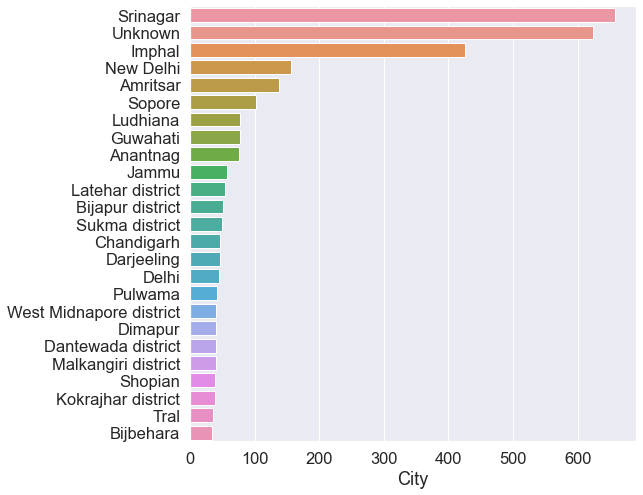

In [29]:
plt.subplots(figsize=(8,8))
sns.barplot(data=df_India,x=df_India['City'].value_counts(),y=df_India['City'].value_counts().index,
           order = df_India['City'].value_counts().iloc[:25].index)
plt.show()

### Kills in India

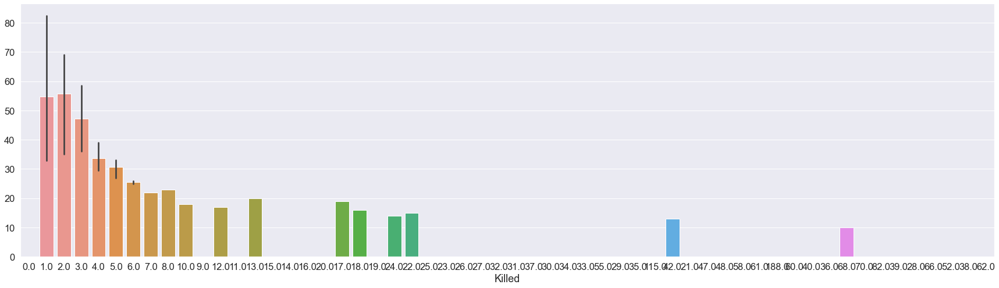

array([  0.,   4.,  nan,   3.,   1.,   2.,   6.,   9.,  20.,  19.,   5.,
        10.,  14.,  31.,   7.,   8.,  15.,  11.,  24.,  34.,  13.,  32.,
        37.,  12.,  18.,  21.,  17.,  16.,  27.,  23.,  29.,  47.,  30.,
        48.,  62.,  42.,  38., 115.,  61.,  22.,  70.,  33.,  25.,  39.,
        60.,  26.,  35.,  52.,  28.,  55., 188.,  66.,  40.,  58.,  68.,
        82.,  36.])

In [30]:
plt.subplots(figsize=(30,8))
sns.barplot(data=df_India,x=df_India['Killed'].value_counts(),y=df_India['Killed'].value_counts().index,
           order = df_India['Killed'].value_counts().index)
plt.show()

df_India["Killed"].unique()

### Wounds in India

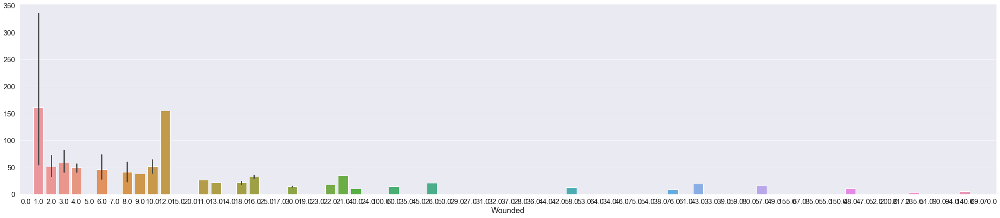

In [31]:
plt.subplots(figsize=(40,8))
sns.barplot(data=df_India,x=df_India['Wounded'].value_counts(),y=df_India['Wounded'].value_counts().index,
           order = df_India['Wounded'].value_counts().index)
plt.show()

### Terrorist Groups

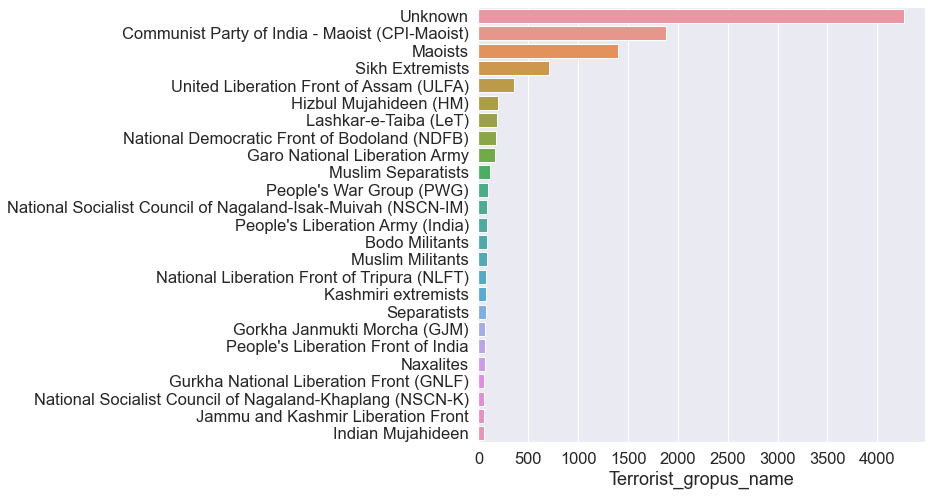

In [32]:
plt.subplots(figsize=(8,8))
sns.barplot(data=df_India,
            x=df_India['Terrorist_gropus_name'].value_counts(),
            y=df_India['Terrorist_gropus_name'].value_counts().index,
            order = df_India['Terrorist_gropus_name'].value_counts().iloc[:25].index)
plt.show()

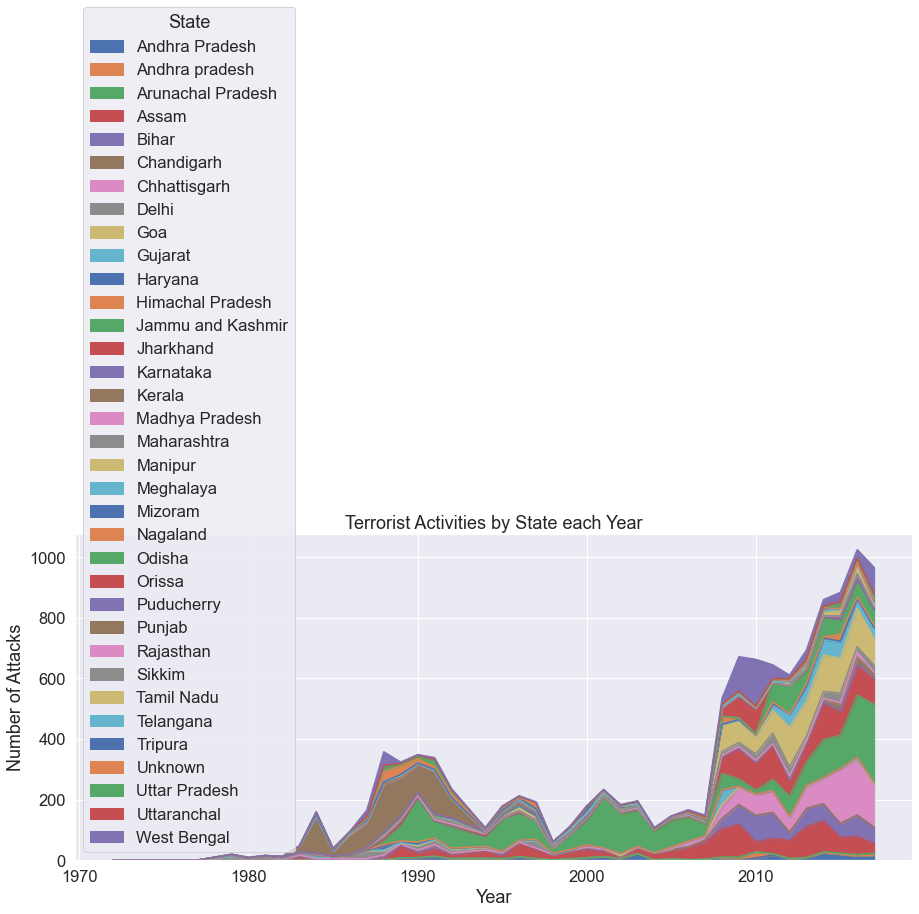

In [33]:
pd.crosstab(df_India['Year'], df_India['State']).plot(kind='area',figsize=(15,6))
plt.title('Terrorist Activities by State each Year')
plt.ylabel('Number of Attacks')
plt.show()

### Target

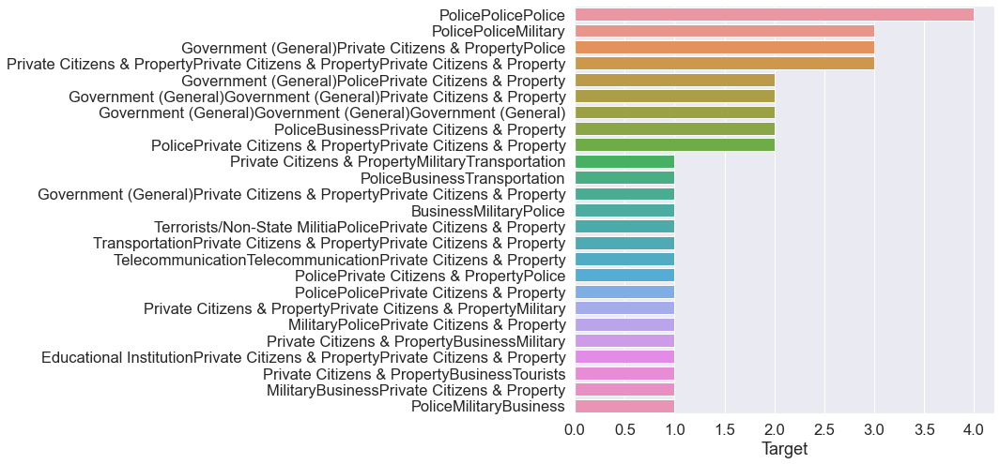

In [34]:
plt.subplots(figsize=(8,8))
sns.barplot(data=df_India,
            x=df_India['Target'].value_counts(),
            y=df_India['Target'].value_counts().index,
            order = df_India['Target'].value_counts().iloc[:25].index)
plt.show()

### Damage Property

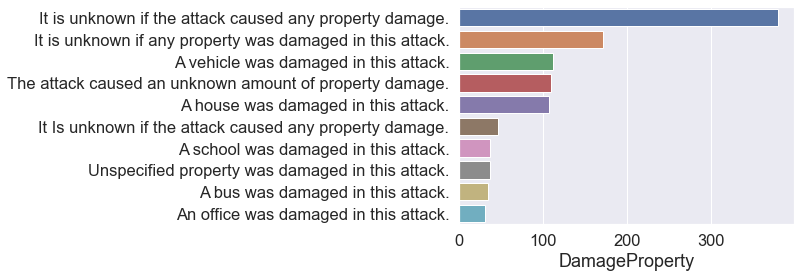

In [35]:
plt.subplots()
sns.barplot(x=df_India['DamageProperty'].value_counts(),
            y=df_India['DamageProperty'].value_counts().index,
            order = df_India['DamageProperty'].value_counts().iloc[:10].index)
plt.show()

### Attack Type

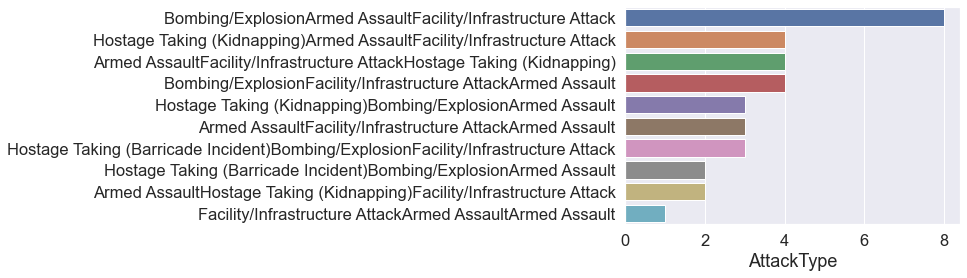

In [36]:
plt.subplots()
sns.barplot(x=df_India['AttackType'].value_counts(),
            y=df_India['AttackType'].value_counts().index,
            order = df_India['AttackType'].value_counts().iloc[:10].index)
plt.show()

In [37]:
#pip install folium

In [38]:
def color_point(x):
    if x>=30:
        color='red'
    elif ((x>0 and x<30)):
        color='blue'
    else:
        color='orange'
    return color   
def point_size(x):
    if (x>30 and x<100):
        size=2
    elif (x>=100 and x<500):
        size=8
    elif x>=500:
        size=16
    else:
        size=0.5
    return size

terror_india_fol=df_India.copy()
terror_india_fol.dropna(subset=['Latitude', 'Longitude'],inplace=True)
location_ind=terror_india_fol[['Latitude', 'Longitude']][:5000]
city_ind=terror_india_fol['City'][:5000]
killed_ind=terror_india_fol['Killed'][:5000]
wound_ind=terror_india_fol['Wounded'][:5000]
target_ind=terror_india_fol['Target'][:5000]

map4 = folium.Map(location=[20.59, 78.96],tiles='cartodbpositron',zoom_start=4.5)
for point in location_ind.index:
    folium.CircleMarker(list(location_ind.loc[point].values),popup='<b>City: </b>'+str(city_ind[point])+'<br><b>Killed: </b>'+str(killed_ind[point])+\
                        '<br><b>Injured: </b>'+str(wound_ind[point])+'<br><b>Target: </b>'+str(target_ind[point]),radius=point_size(killed_ind[point]),color=color_point(killed_ind[point]),fill_color=color_point(killed_ind[point])).add_to(map4)
map4    

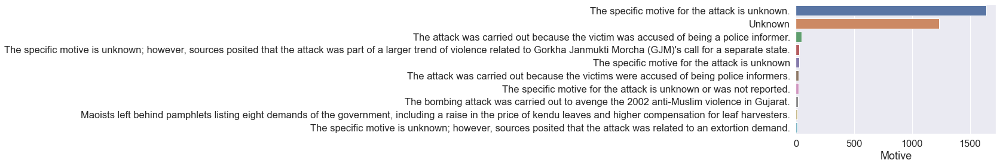

In [40]:
plt.subplots()
sns.barplot(x=df_India['Motive'].value_counts(),
            y=df_India['Motive'].value_counts().index,
            order = df_India['Motive'].value_counts().iloc[:10].index)
plt.show()

### Count of Suicides in India

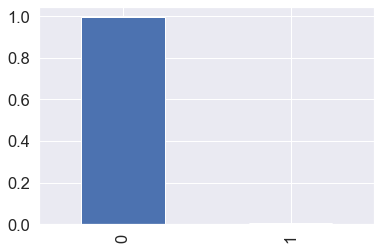

Count of Suicide in india: 0    11900
1       60
Name: Suicide, dtype: int64


In [41]:
plt.figure()
df_India["Suicide"].value_counts(normalize=True).plot(kind="bar")
plt.title("")
plt.ylabel("")
plt.xlabel("")
plt.show()

print('Count of Suicide in india:',df_India["Suicide"].value_counts())